## Imports

In [1]:
%load_ext autoreload
%autoreload 2

import os
import sys
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
from skimage import morphology
import seaborn as sns
import pandas as pd
from aicsimageio import AICSImage

sys.path.append(os.path.relpath("../src"))
from CellAnalyzer import CellAnalyzer

12-Mar-26 18:21:55 - bfio.backends - WARNING  - Java backend is not available. This could be due to a missing dependency (jpype).


## Initialize CellAnalyzer

In [2]:
in_path = r"Z:\Thiel\Imaging_Data\Camelid_Human_ALI_Project\16072025_images_sc_manuscript_repeat_40x_SO\01_raw\01.1_grouped_renamed_normal_staining\Human_5_229E"
# in_path = r"C:\Users\roman\Documents\Vetsuisse\imaging_data\ALI_examples\test_set"

In [3]:
out_path = r"C:\Users\roman\Documents\Data\vetsuisse_imaging_data\ALI_examples"

In [ ]:
# ca = CellAnalyzer(path=in_path) # New instance
ca = CellAnalyzer.load(out_path, load_images=False) # Load existing instance

>>> GPU activated? NO


## Read in and inspect data

In [ ]:
# df, img_arrays = ca.read_data()

In [ ]:
# num_c = ca.img_arrays[0].shape[0]
# num_imgs = len(ca.img_arrays)
# display_range = (0, 1500)

In [ ]:
# print("shape:", ca.img_arrays[0].shape)

# fig, ax = plt.subplots(num_imgs, num_c, figsize=(6*num_c, 3*num_imgs))

# for i in range(num_imgs):

#     img_ex = ca.img_arrays[i].copy()
#     print("ranges per channel:", [(img_ex[c].min(), img_ex[c].max()) for c in range(img_ex.shape[0])])

#     for c in range(img_ex.shape[0]):
#         ax[i, c].hist(img_ex[c].ravel(), bins=50, range=display_range, alpha=0.5, label=f"Channel {c}", edgecolor='black')

## Projections

In [ ]:
types = ['max', 'max', 'max', 'max']  # Example projection types for each channel
proj = ca.create_projections(types = types) # gob, inf, ZO1, cil

In [32]:
ca.cfg_df

,projection
0,max
1,max
2,max
3,max


In [9]:
num_c = ca.projections[0].shape[0]
num_imgs = len(ca.projections)
display_range = (0, 1500)

Example shape: (4, 2304, 2304)
Image 0 - ranges per channel: [(133, 19090), (116, 5796), (110, 17635), (119, 11145)]
Image 1 - ranges per channel: [(134, 3138), (114, 7245), (110, 2469), (119, 12132)]
Image 2 - ranges per channel: [(142, 1573), (116, 6399), (113, 1199), (123, 5008)]
Image 3 - ranges per channel: [(145, 20370), (130, 5916), (113, 1635), (125, 15032)]
Image 4 - ranges per channel: [(145, 19058), (111, 4595), (113, 1750), (120, 9281)]
Image 5 - ranges per channel: [(133, 2048), (129, 7413), (111, 1660), (116, 16048)]
Image 6 - ranges per channel: [(142, 2307), (125, 7216), (112, 1741), (127, 51155)]
Image 7 - ranges per channel: [(145, 2190), (115, 10221), (115, 12116), (127, 30240)]
Image 8 - ranges per channel: [(156, 21119), (106, 499), (113, 1625), (125, 6447)]
Image 9 - ranges per channel: [(143, 1362), (105, 539), (113, 2012), (116, 3942)]
Image 10 - ranges per channel: [(152, 2441), (105, 2573), (113, 1887), (124, 5597)]
Image 11 - ranges per channel: [(149, 2448),

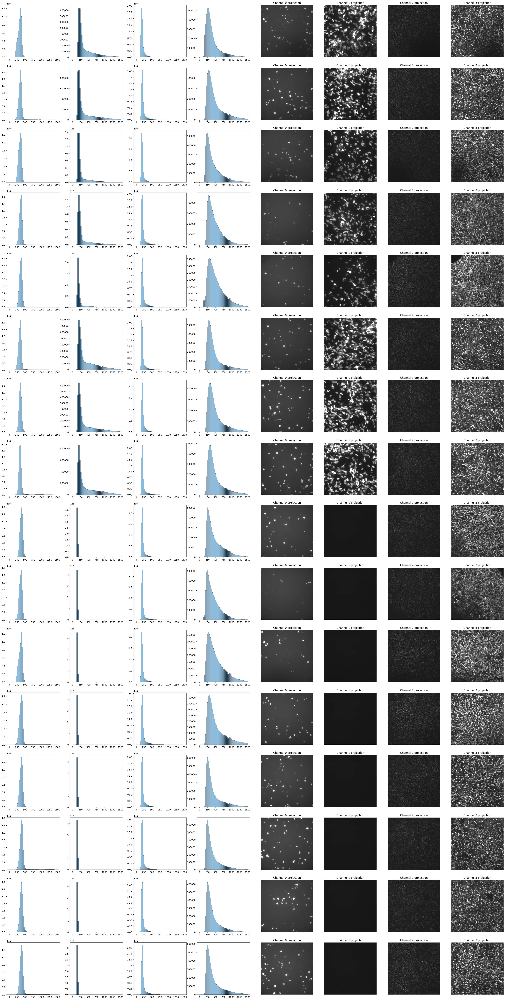

In [10]:
print("Example shape:", ca.projections[0].shape)

fig, ax = plt.subplots(num_imgs, 2*num_c, figsize=(5*2*num_c, 5*num_imgs))

for i, proj_ex in enumerate(ca.projections):
    print(f"Image {i} - ranges per channel:", [(proj_ex[c].min(), proj_ex[c].max()) for c in range(proj_ex.shape[0])])

    for c in range(num_c):
        ax[i, c].hist(proj_ex[c].ravel(), bins=50, range=display_range, alpha=0.5, edgecolor='black')
        im_norm = proj_ex[c]
        ax[i, num_c + c].imshow(im_norm, cmap='gray', vmin=display_range[0], vmax=display_range[1])
        ax[i, num_c + c].set_title(f"Channel {c} projection")
        ax[i, num_c + c].axis('off')

In [ ]:
# ca.save(out_path + r"\CellAnalyzer", overwrite=False)

## Segmentation

In [ ]:
# masks, flows, styles, imgs_dn, outlines = ca.segment_cells(diameter=75, channels=[3,0], log=True)

Starting segmentation with Cellpose...
Segmentation done. Post-processing results...
Number of masks: 16
Processing mask 1/16 (int_type=int32)...
Processing mask 2/16 (int_type=int32)...
Processing mask 3/16 (int_type=int32)...
Processing mask 4/16 (int_type=int32)...
Processing mask 5/16 (int_type=int32)...
Processing mask 6/16 (int_type=int32)...
Processing mask 7/16 (int_type=int32)...
Processing mask 8/16 (int_type=int32)...
Processing mask 9/16 (int_type=int32)...
Processing mask 10/16 (int_type=int32)...
Processing mask 11/16 (int_type=int32)...
Processing mask 12/16 (int_type=int32)...
Processing mask 13/16 (int_type=int32)...
Processing mask 14/16 (int_type=int32)...
Processing mask 15/16 (int_type=int32)...
Processing mask 16/16 (int_type=int32)...
Post-processing done.
Creating cells DataFrame...
Processing image 1/16 for cells DataFrame...
Processing image 2/16 for cells DataFrame...
Processing image 3/16 for cells DataFrame...
Processing image 4/16 for cells DataFrame...
Pr

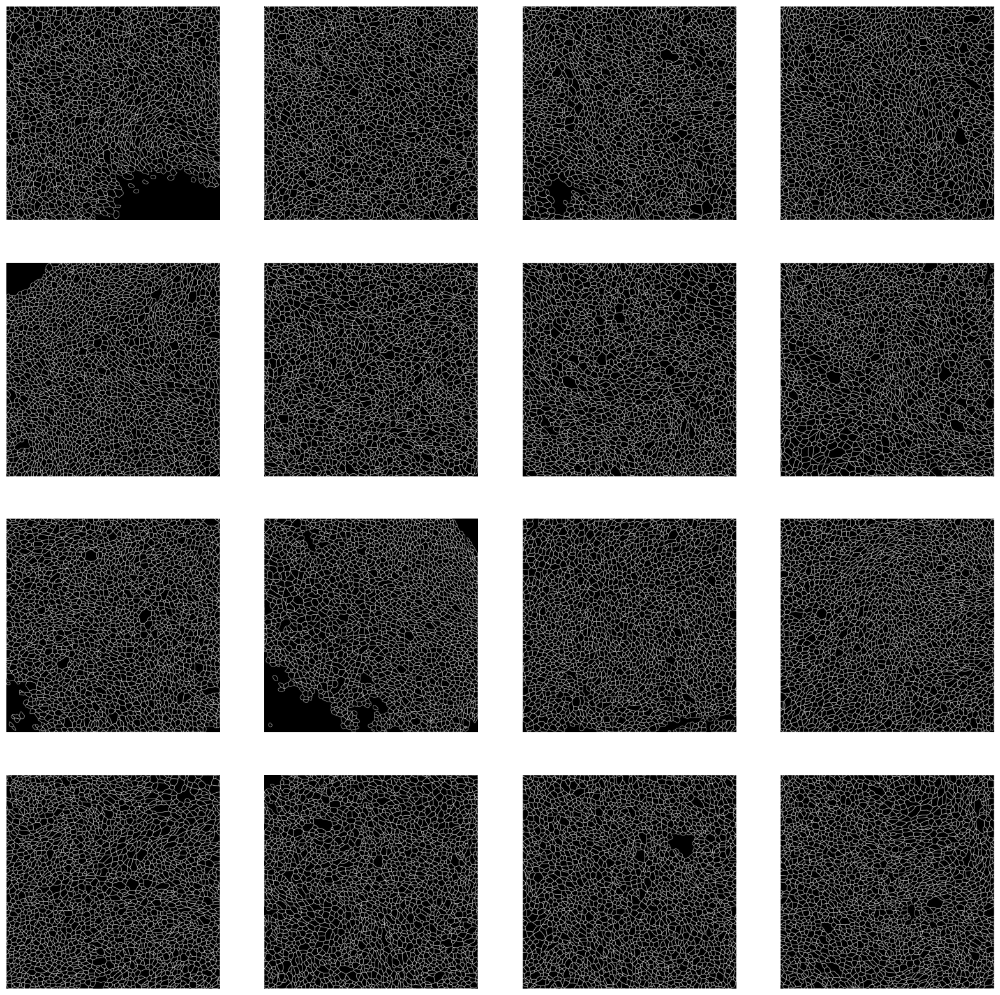

In [11]:
cols = 4
rows = np.ceil(num_imgs / cols).astype(int)
fig, ax = plt.subplots(rows, cols, figsize = (cols * 5, rows * 5))
ax_lin = ax.ravel()

for i in range(num_imgs):
    ax_lin[i].imshow(morphology.dilation(ca.outlines[i], np.ones((3,3))), cmap='gray') # ca.masks[i])
    ax_lin[i].axis("off")
plt.show()

In [127]:
ca.save_segmentation_imgs(background_channels=[4, 2, 1], norm_per_img=False, overwrite=True, folder_name=out_path + r"\Segmentation_Masks")

16 outlines saved.
16 masks saved.


In [ ]:
# ca.save(out_path + r"\CellAnalyzer", overwrite=True)

## Get the cell signals (means, percentiles etc.)

In [44]:
# cells_df, signal_masks = ca.calculate_cell_signals(channels = {"infection":2, "cilia":4}, mode="mean")
# cells_df, signal_masks = ca.calculate_single_cell_signal(channel_name="goblet", channel_num=1, mode="perc_25")
cells_df, signal_masks = ca.calculate_cell_signals(channels={"goblet": 1, "infection":2, "cilia": 4},
                                                   dilate={"infection": 0, "cilia": -5},
                                                   mode={"goblet": "perc_25"})

No dilation given for goblet, applying no dilation for this channel.
No mode given for infection, applying mean for this channel.
No mode given for cilia, applying mean for this channel.


c:\Users\roman\miniforge3\envs\ivi-env\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\roman\miniforge3\envs\ivi-env\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
c:\Users\roman\miniforge3\envs\ivi-env\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\roman\miniforge3\envs\ivi-env\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
c:\Users\roman\miniforge3\envs\ivi-env\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\roman\miniforge3\envs\ivi-env\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invali

In [45]:
ca.cells_df.head()

,prefix,condition,temp,host,donor,mag,time,date,sample,replicate,...,filepath,projection_types,cell_area_px,num_neighbours,goblet_signal,goblet_signal_log10,infection_signal,infection_signal_log10,cilia_signal,cilia_signal_log10
cell_id,,,,,,,,,,,,,,,,,,,,,
1,v,229E,33,Human,D5,40x,48hpi,2025-07-14,001,1,...,\\resstore.unibe.ch\vetsuisse_ivi\Thiel\Imagin...,"[max, max, max, max]",1566,4,298.0,2.474216,1197.385696,3.078234,401.300412,2.603470
2,v,229E,33,Human,D5,40x,48hpi,2025-07-14,001,1,...,\\resstore.unibe.ch\vetsuisse_ivi\Thiel\Imagin...,"[max, max, max, max]",2754,7,310.0,2.491362,716.996369,2.855517,1079.286375,3.033137
3,v,229E,33,Human,D5,40x,48hpi,2025-07-14,001,1,...,\\resstore.unibe.ch\vetsuisse_ivi\Thiel\Imagin...,"[max, max, max, max]",3101,8,321.0,2.506505,292.252822,2.465759,1020.011558,3.008605
4,v,229E,33,Human,D5,40x,48hpi,2025-07-14,001,1,...,\\resstore.unibe.ch\vetsuisse_ivi\Thiel\Imagin...,"[max, max, max, max]",5832,10,330.0,2.518514,218.453532,2.339359,414.477258,2.617501
5,v,229E,33,Human,D5,40x,48hpi,2025-07-14,001,1,...,\\resstore.unibe.ch\vetsuisse_ivi\Thiel\Imagin...,"[max, max, max, max]",1534,4,334.0,2.523746,247.490874,2.393559,473.663801,2.675470


In [46]:
ca.cfg_df

,channel_name,projection,dilate,mode
0,goblet,max,0,perc_25
1,infection,max,0,mean
2,NaN,max,<NA>,NaN
3,cilia,max,-5,mean


In [47]:
# ca.cells_df.groupby('prefix').agg({'cell_area_px':'mean', 'num_neighbours':'mean', 'infection_mean_log10':['mean', 'std'], 'goblet_mean_log10':'mean', 'cilia_mean_log10':'mean'})
ca.cells_df.groupby('prefix').agg({'cell_area_px':'mean', 'num_neighbours':'mean', 'infection_signal_log10':['mean', 'std'], 'goblet_signal_log10':'mean', 'cilia_signal_log10':'mean'})

cell_area_px num_neighbours infection_signal_log10            \
               mean           mean                   mean       std   
prefix                                                                
m       2208.542277      10.176196               2.152124  0.011963   
v       2294.637212      10.095529               2.505589  0.269287   

       goblet_signal_log10 cilia_signal_log10  
                      mean               mean  
prefix                                         
m                 2.548606           2.643876  
v                 2.515190           2.665162

In [113]:
mock_inf_log10 = ca.cells_df[ca.cells_df['prefix']=='m']['infection_signal_log10'].values

# inf_log10_thresh = mock_inf_log10.mean() + 3 * mock_inf_log10.std()
# inf_log10_thresh_low = mock_inf_log10.mean() + 1 * mock_inf_log10.std()

inf_log10_thresh = np.percentile(mock_inf_log10, 99.99)
inf_log10_thresh_low = np.percentile(mock_inf_log10, 95)

threshs = [inf_log10_thresh, inf_log10_thresh_low]
print(f"Inf log10 thresholds: {inf_log10_thresh_low} | {inf_log10_thresh}")

Inf log10 thresholds: 2.170525390499723 | 2.204644104257456


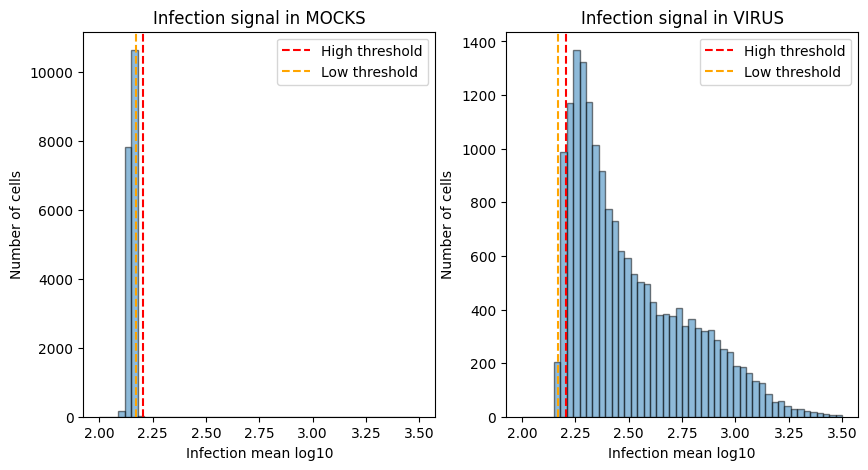

In [114]:
virus_inf_log10 = ca.cells_df[ca.cells_df['prefix']=='v']['infection_signal_log10'].values

fig, ax = plt.subplots(1,2, figsize=(2*5,1*5))

ax[0].hist(mock_inf_log10, bins=50, alpha=0.5, edgecolor='black', range=(2,3.5))
ax[0].set_title('Infection signal in MOCKS')
ax[1].hist(virus_inf_log10, bins=50, alpha=0.5, edgecolor='black', range=(2,3.5))
ax[1].set_title('Infection signal in VIRUS')
for a in ax:
    a.axvline(inf_log10_thresh, color='red', linestyle='--', label='High threshold')
    a.axvline(inf_log10_thresh_low, color='orange', linestyle='--', label='Low threshold')
    a.set_xlabel('Infection mean log10')
    a.set_ylabel('Number of cells')
    a.legend()
plt.show()

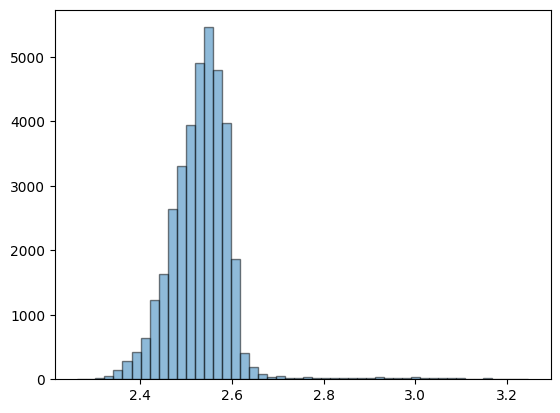

In [111]:
# files = ca.cells_df['filename'].unique()
# num_cols = 4
# num_rows = np.ceil(len(files) / num_cols).astype(int)
# fig, ax = plt.subplots(num_rows, num_cols, figsize=(num_cols*5, num_rows*5))
# all_ax = ax.ravel()
# for i, image in enumerate(files):
#     signal = ca.cells_df[(ca.cells_df['filename'] == image)]['goblet_signal_log10'].values
#     all_ax[i].hist(signal, bins=50, alpha=0.5, edgecolor='black', range=(2,3.5))
#     all_ax[i].set_title('Goblet signal in MOCKS')

plt.hist(ca.cells_df['goblet_signal_log10'].values, bins=50, alpha=0.5, edgecolor='black')

plt.show()

In [128]:
ca.save_signal_masks(folder_name=out_path + r"\Signal_Masks", overwrite=True)

16 masks for signal 'infection' saved.
16 masks for signal 'goblet' saved.
16 masks for signal 'cilia' saved.


In [ ]:
# ca.save(out_path + r"\CellAnalyzer", overwrite=False)

## Bin/threshold

In [ ]:
cells_df, bin_masks = ca.bin_cell_signals(signals=["infection", "goblet", "cilia"], use_log=True) #, thresh=None) # thresh=threshs)

In [ ]:
# ca.bin_cell_signals("goblet", use_log=True) #, thresh=2.75)

In [ ]:
# ca.bin_cell_signal("cilia", use_log=True, thresh=None)

In [80]:
ca.cells_df.head()

,prefix,condition,temp,host,donor,mag,time,date,sample,replicate,...,num_neighbours,goblet_signal,goblet_signal_log10,infection_signal,infection_signal_log10,cilia_signal,cilia_signal_log10,infection_bin,goblet_bin,cilia_bin
cell_id,,,,,,,,,,,,,,,,,,,,,
1,v,229E,33,Human,D5,40x,48hpi,2025-07-14,001,1,...,4,298.0,2.474216,1197.385696,3.078234,401.300412,2.603470,positive,negative,negative
2,v,229E,33,Human,D5,40x,48hpi,2025-07-14,001,1,...,7,310.0,2.491362,716.996369,2.855517,1079.286375,3.033137,positive,negative,positive
3,v,229E,33,Human,D5,40x,48hpi,2025-07-14,001,1,...,8,321.0,2.506505,292.252822,2.465759,1020.011558,3.008605,negative,negative,positive
4,v,229E,33,Human,D5,40x,48hpi,2025-07-14,001,1,...,10,330.0,2.518514,218.453532,2.339359,414.477258,2.617501,negative,negative,negative
5,v,229E,33,Human,D5,40x,48hpi,2025-07-14,001,1,...,4,334.0,2.523746,247.490874,2.393559,473.663801,2.675470,negative,negative,negative


In [72]:
ca.cfg_df

,channel_name,projection,signal_dilate,signal_mode,bin_use_log,bin_threshold_type,bin_threshold(s)
0,goblet,max,0,perc_25,True,otsu,[2.525760672300656]
1,infection,max,0,mean,True,otsu,[2.4928013126478126]
2,NaN,max,<NA>,NaN,NaN,NaN,NaN
3,cilia,max,-5,mean,True,otsu,[2.693424974878395]


In [74]:
for sig in ["infection_signal", "goblet_signal", "cilia_signal"]:
    print(f"Signal: {sig}")
    print(f"MOCKS: {ca.cells_df[ca.cells_df['prefix']=='m'][sig].value_counts()}")
    print(f"VIRUS: {ca.cells_df[ca.cells_df['prefix']=='v'][sig].value_counts()}")
    print()

Signal: infection_signal
MOCKS: infection_signal
141.000000    3
140.000000    3
142.000000    3
143.488812    2
142.052214    2
             ..
138.944593    1
137.728721    1
137.766748    1
135.570936    1
139.256410    1
Name: count, Length: 18602, dtype: int64
VIRUS: infection_signal
1197.385696    1
256.779652     1
186.755682     1
204.944778     1
286.753409     1
              ..
197.422409     1
267.676010     1
748.541811     1
182.239244     1
599.441667     1
Name: count, Length: 18005, dtype: int64

Signal: goblet_signal
MOCKS: goblet_signal
381.00    215
376.00    208
386.00    196
375.00    195
366.00    193
         ... 
415.75      1
327.25      1
665.00      1
377.50      1
206.00      1
Name: count, Length: 888, dtype: int64
VIRUS: goblet_signal
356.0     203
355.0     202
346.0     198
343.0     197
349.0     194
         ... 
831.0       1
630.0       1
444.0       1
1088.0      1
189.0       1
Name: count, Length: 787, dtype: int64

Signal: cilia_signal
MOCKS: ci

In [129]:
ca.save_bin_masks(folder_name=out_path + r"\Bin_Masks", overwrite=True)

16 bin masks for signal 'infection' saved.
16 bin masks for signal 'goblet' saved.
16 bin masks for signal 'cilia' saved.


In [ ]:
ca.save(out_path + r"\CellAnalyzer", overwrite=False)

## Populations

In [96]:
# col_name = "inf_cil_gob_(inf-otsu_gob_perc_25_log10_manual_2.75)" # "inf_gob_(inf-perc95-99.99)"
cells_df = ca.create_populations(["infection", "cilia", "goblet"]) # "goblet_perc_25_log10_manual_2.75"], col_name=col_name)

In [97]:
ca.cells_df.head()

,prefix,condition,temp,host,donor,mag,time,date,sample,replicate,...,goblet_signal,goblet_signal_log10,infection_signal,infection_signal_log10,cilia_signal,cilia_signal_log10,infection_bin,goblet_bin,cilia_bin,inf_cil_gob_pop
cell_id,,,,,,,,,,,,,,,,,,,,,
1,v,229E,33,Human,D5,40x,48hpi,2025-07-14,001,1,...,298.0,2.474216,1197.385696,3.078234,401.300412,2.603470,positive,negative,negative,inf-pos_cil-neg_gob-neg
2,v,229E,33,Human,D5,40x,48hpi,2025-07-14,001,1,...,310.0,2.491362,716.996369,2.855517,1079.286375,3.033137,positive,negative,positive,inf-pos_cil-pos_gob-neg
3,v,229E,33,Human,D5,40x,48hpi,2025-07-14,001,1,...,321.0,2.506505,292.252822,2.465759,1020.011558,3.008605,negative,negative,positive,inf-neg_cil-pos_gob-neg
4,v,229E,33,Human,D5,40x,48hpi,2025-07-14,001,1,...,330.0,2.518514,218.453532,2.339359,414.477258,2.617501,negative,negative,negative,inf-neg_cil-neg_gob-neg
5,v,229E,33,Human,D5,40x,48hpi,2025-07-14,001,1,...,334.0,2.523746,247.490874,2.393559,473.663801,2.675470,negative,negative,negative,inf-neg_cil-neg_gob-neg


In [99]:
col_name = "inf_cil_gob_pop" # "inf_gob_(inf-perc95-99.99)"
print("MOCKS:")
mock_non_partials = ca.cells_df[(ca.cells_df['prefix']=='m') & (ca.cells_df['infection_bin']!="partial")][col_name]
mock_non_partials.value_counts()

MOCKS:


inf_cil_gob_pop
inf-neg_cil-neg_gob-pos    7615
inf-neg_cil-pos_gob-pos    4781
inf-neg_cil-neg_gob-neg    4228
inf-neg_cil-pos_gob-neg    2003
Name: count, dtype: int64

In [100]:
print("VIRUS:")
virus_non_partials = ca.cells_df[(ca.cells_df['prefix']=='v') & (ca.cells_df['infection_bin']!="partial")][col_name]
virus_non_partials.value_counts()

VIRUS:


inf_cil_gob_pop
inf-neg_cil-neg_gob-neg    3896
inf-pos_cil-neg_gob-neg    2677
inf-neg_cil-neg_gob-pos    2665
inf-neg_cil-pos_gob-pos    2251
inf-pos_cil-neg_gob-pos    1759
inf-neg_cil-pos_gob-neg    1744
inf-pos_cil-pos_gob-neg    1579
inf-pos_cil-pos_gob-pos    1434
Name: count, dtype: int64

In [130]:
ca.save_population_masks(signals=["cilia", "infection", "goblet"], folder_name=out_path + r"\Population_Masks", overwrite=True)

16 populations saved.
Legend saved.
Folder: C:\Users\roman\Documents\Data\vetsuisse_imaging_data\ALI_examples\Population_Masks\cil_inf_gob_pop


In [ ]:
ca.save(out_path + r"\CellAnalyzer", overwrite=False)

In [131]:
ca.save_population_masks(signals=["cilia", "infection"], folder_name=out_path + r"\Population_Masks", overwrite=True, rgb_channels=(0, 1))
ca.save_population_masks(signals=["infection", "goblet"], folder_name=out_path + r"\Population_Masks", overwrite=True, rgb_channels=(1, 2))
ca.save_population_masks(signals=["cilia", "goblet"], folder_name=out_path + r"\Population_Masks", overwrite=True, rgb_channels=(0, 2))

16 populations saved.
Legend saved.
Folder: C:\Users\roman\Documents\Data\vetsuisse_imaging_data\ALI_examples\Population_Masks\cil_inf_pop
16 populations saved.
Legend saved.
Folder: C:\Users\roman\Documents\Data\vetsuisse_imaging_data\ALI_examples\Population_Masks\inf_gob_pop
16 populations saved.
Legend saved.
Folder: C:\Users\roman\Documents\Data\vetsuisse_imaging_data\ALI_examples\Population_Masks\cil_gob_pop


## Analyze results

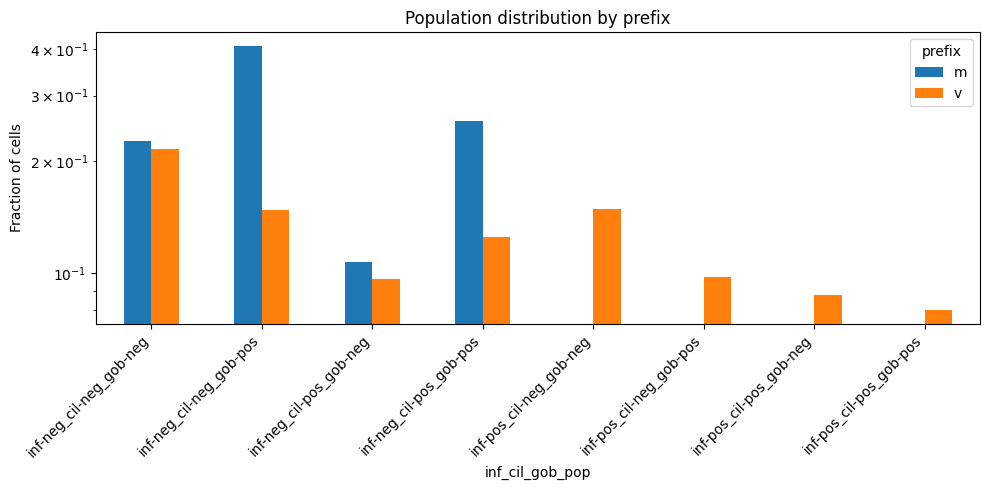

In [104]:
# pop_col = col_name
pop_col = "inf_cil_gob_pop"

# Get cells_df without infection "partial"AICSImage
df = ca.cells_df[ca.cells_df['infection_bin']!="partial"]

# Count occurrences of each population per condition
# counts = df.groupby(["prefix", "inf_cil_gob_pop"]).size().reset_index(name="count")
counts = df.groupby(["prefix", pop_col]).size().reset_index(name="count")

# Optionally normalize to relative frequencies
counts["freq"] = counts.groupby("prefix")["count"].transform(lambda x: x / x.sum())

# Pivot for plotting
pivot = counts.pivot(index=pop_col, columns="prefix", values="freq").fillna(0)

# Plot as grouped bar chart
pivot.plot(kind="bar", figsize=(10,5))
plt.yscale("log")
plt.ylabel("Fraction of cells")
plt.title("Population distribution by prefix")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

In [105]:
second_signal = 'goblet_bin' #'goblet_perc_25_log10_manual_2.75'
signal_title = "goblet" if "goblet" in second_signal else "cilia" if "cilia" in second_signal else second_signal
signal_title

'goblet'

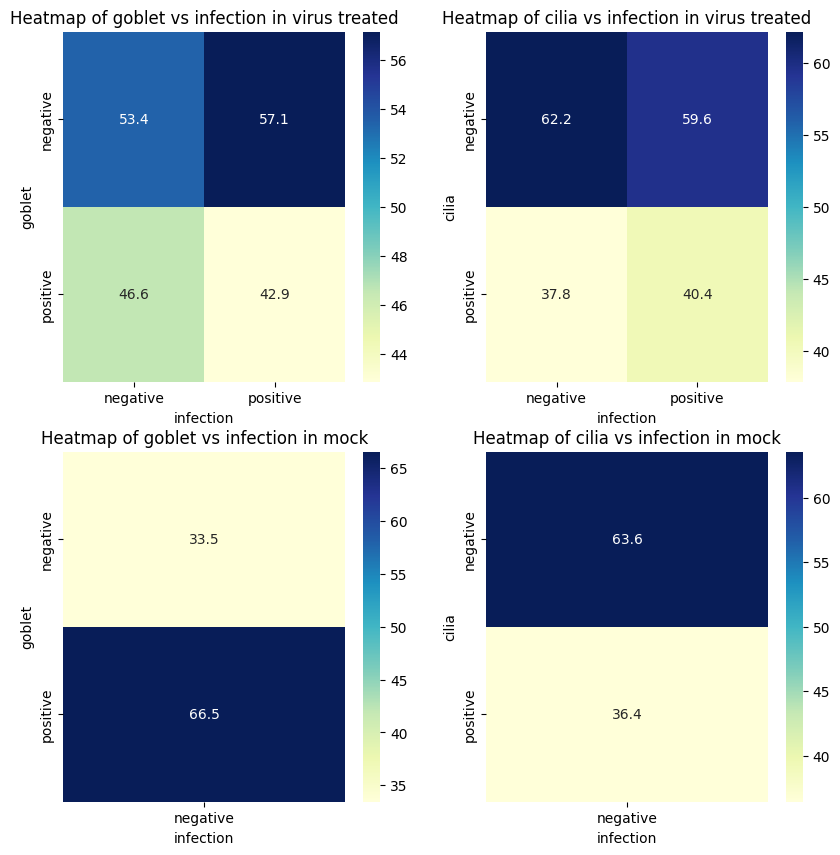

In [108]:
prefixes = ['v', 'm']
second_signals = ['goblet_bin', 'cilia_bin'] #['goblet_perc_25_log10_manual_2.75', 'cilia']
fig, ax = plt.subplots(2,2, figsize=(2*5,2*5))
for i, prefix in enumerate(prefixes):
    for j, second_signal in enumerate(second_signals):
        ax_ = ax[i, j]
        # Plot a heatmap with goblet against infection
        df_subset = ca.cells_df[ca.cells_df['prefix'] == prefix]
        # Make sure to use infected as x axis
        # pivot = pd.crosstab(df_subset[second_signal], df_subset['infection'])
        pivot = pd.crosstab(df_subset[second_signal], 
                    df_subset['infection_bin'], 
                    normalize='columns') * 100
        sns.heatmap(pivot, annot=True, fmt=".1f", cmap="YlGnBu", ax=ax_)
        sample_title = {'v':'virus treated', 'm': 'mock'}[prefix]
        signal_title = "goblet" if "goblet" in second_signal else "cilia" if "cilia" in second_signal else second_signal
        ax_.set_title(f"Heatmap of {signal_title} vs infection in {sample_title}")
        ax_.set_xlabel("infection")
        ax_.set_ylabel(signal_title)